<a href="https://colab.research.google.com/github/ima-projects/Private_Equity_Data_Analysis/blob/main/PrivateEquityDataAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
# Import Libraries

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)



In [78]:
# Read in the data

df = pd.read_csv('/content/Combined_WSIB_cleaned_filtered_sheets.pdf - Sheet1.csv')


In [49]:
# Looking at the data 

df.head()

,report_date,assigned_unid,fund_name,initial_investment_date,commitment,contributions,unfunded_commitment,current_market_value,distributions,total_value,tvpi,net_benefit,irr,strategy
0,6/30/2021,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,92769883,5570827,76755498,100266779.0,177022277,1.9,84252394,0.1290,Corporate Finance/Buyout - Small
1,3/31/2021,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,92349345,5991365,59567695,99447831.0,159015526,1.7,66666182,0.1128,Corporate Finance/Buyout - Small
2,12/31/2020,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,92349345,5991365,59298238,99447831.0,158746069,1.7,66396725,0.1143,Corporate Finance/Buyout - Small
3,9/30/2020,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,90479601,5991365,53564275,96010587.0,149574862,1.7,59095262,0.1072,Corporate Finance/Buyout - Small
4,6/30/2020,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,90523301,5991365,43620935,96010587.0,139631522,1.5,49108221,0.0954,Corporate Finance/Buyout - Small


In [7]:
# Seeing if there is any missing data

for col in df.columns:
  pct_missing = np.mean(df[col].isnull())
  print('{} - {}%'.format(col, pct_missing))

report_date - 0.0%
assigned_unid - 0.0%
fund_name - 0.0%
initial_investment_date - 0.0%
commitment - 0.0%
contributions - 0.0%
unfunded_commitment - 0.0%
current_market_value - 0.0%
distributions - 0.0012001200120012002%
total_value - 0.0%
tvpi - 0.0042004200420042%
net_benefit - 0.0%
irr - 0.023402340234023402%
strategy - 0.0%


In [ ]:
# From the output provided, most columns have no missing values, as indicated by 0.0% missing values. However, a few columns have a small percentage of missing values:
# "distributions" column has 0.0012% missing values, which means only a very small fraction of data is missing in that column.
# "tvpi" column has 0.0042% missing values, again a very small proportion of missing data.
# "irr" column has 0.0234% missing values, still a relatively low percentage compared to the total data.

# Overall, it seems that the dataset has a relatively small amount of missing data, which is a good sign for data quality.

In [8]:
# Data types for the columns

df.dtypes

report_date                 object
assigned_unid               object
fund_name                   object
initial_investment_date     object
commitment                   int64
contributions                int64
unfunded_commitment          int64
current_market_value         int64
distributions              float64
total_value                  int64
tvpi                       float64
net_benefit                  int64
irr                        float64
strategy                    object
dtype: object

In [80]:
# Converting/casting distributions from float64 (non-finite/inf) to integer(int)
df['distributions'] = pd.to_numeric(df['distributions'], errors='coerce').fillna(0).astype('int64')

df

,report_date,assigned_unid,fund_name,initial_investment_date,commitment,contributions,unfunded_commitment,current_market_value,distributions,total_value,tvpi,net_benefit,irr,strategy
0,6/30/2021,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,92769883,5570827,76755498,100266779,177022277,1.90,84252394,0.1290,Corporate Finance/Buyout - Small
1,3/31/2021,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,92349345,5991365,59567695,99447831,159015526,1.70,66666182,0.1128,Corporate Finance/Buyout - Small
2,12/31/2020,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,92349345,5991365,59298238,99447831,158746069,1.70,66396725,0.1143,Corporate Finance/Buyout - Small
3,9/30/2020,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,90479601,5991365,53564275,96010587,149574862,1.70,59095262,0.1072,Corporate Finance/Buyout - Small
4,6/30/2020,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,90523301,5991365,43620935,96010587,139631522,1.50,49108221,0.0954,Corporate Finance/Buyout - Small
5,3/31/2020,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,90523906,5991365,40522810,96010587,136533397,1.50,46009491,0.0922,Corporate Finance/Buyout - Small
6,12/31/2019,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,88835018,5991365,52383788,92355971,144739759,1.60,55904741,0.1083,Corporate Finance/Buyout - Small
7,9/30/2019,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,88835018,5991365,52801478,92355971,145157449,1.60,56322431,0.1109,Corporate Finance/Buyout - Small
8,6/30/2019,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,88835018,5991365,61389214,79921627,141310841,1.60,52475823,0.1075,Corporate Finance/Buyout - Small
9,3/31/2019,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,87943935,7011040,65106891,76143929,141250820,1.60,53306885,0.1114,Corporate Finance/Buyout - Small


In [51]:
df.dtypes

report_date                 object
assigned_unid               object
fund_name                   object
initial_investment_date     object
commitment                   int64
contributions                int64
unfunded_commitment          int64
current_market_value         int64
distributions                int64
total_value                  int64
tvpi                       float64
net_benefit                  int64
irr                        float64
strategy                    object
dtype: object

In [52]:
# Create a new column called 'initial_investment_date_year' and extracting only the year from 'initial_investment_date' column

df['initial_investment_date_year'] = df['initial_investment_date'].astype(str).str[-4:]

df

,report_date,assigned_unid,fund_name,initial_investment_date,commitment,contributions,unfunded_commitment,current_market_value,distributions,total_value,tvpi,net_benefit,irr,strategy,initial_investment_date_year
0,6/30/2021,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,92769883,5570827,76755498,100266779,177022277,1.90,84252394,0.1290,Corporate Finance/Buyout - Small,2011
1,3/31/2021,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,92349345,5991365,59567695,99447831,159015526,1.70,66666182,0.1128,Corporate Finance/Buyout - Small,2011
2,12/31/2020,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,92349345,5991365,59298238,99447831,158746069,1.70,66396725,0.1143,Corporate Finance/Buyout - Small,2011
3,9/30/2020,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,90479601,5991365,53564275,96010587,149574862,1.70,59095262,0.1072,Corporate Finance/Buyout - Small,2011
4,6/30/2020,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,90523301,5991365,43620935,96010587,139631522,1.50,49108221,0.0954,Corporate Finance/Buyout - Small,2011
5,3/31/2020,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,90523906,5991365,40522810,96010587,136533397,1.50,46009491,0.0922,Corporate Finance/Buyout - Small,2011
6,12/31/2019,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,88835018,5991365,52383788,92355971,144739759,1.60,55904741,0.1083,Corporate Finance/Buyout - Small,2011
7,9/30/2019,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,88835018,5991365,52801478,92355971,145157449,1.60,56322431,0.1109,Corporate Finance/Buyout - Small,2011
8,6/30/2019,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,88835018,5991365,61389214,79921627,141310841,1.60,52475823,0.1075,Corporate Finance/Buyout - Small,2011
9,3/31/2019,0OhJnjbEk9uP0J2Ar3pz,"Endeavour Capital Fund VI, L.P.",12/1/2011,95000000,87943935,7011040,65106891,76143929,141250820,1.60,53306885,0.1114,Corporate Finance/Buyout - Small,2011


In [76]:
# Sorting the data based on the 'distributions' column

df.sort_values(by=['distributions'], inplace=False, ascending=False)



,report_date,assigned_unid,fund_name,initial_investment_date,commitment,contributions,unfunded_commitment,current_market_value,distributions,total_value,tvpi,net_benefit,irr,strategy
726,6/30/2021,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382186172,17789721,210336865,1.064462e+09,1274798937,3.30,892612765,0.2505,Corporate Finance/Buyout - Mega
727,3/31/2021,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382137053,17835970,214303081,1.034452e+09,1248754945,3.30,866617892,0.2489,Corporate Finance/Buyout - Mega
728,12/31/2020,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382034035,17938988,259564088,9.580618e+08,1217625892,3.20,835591857,0.2466,Corporate Finance/Buyout - Mega
2083,6/30/2021,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763227511,0,459696921,9.039052e+08,1363602162,1.80,600374651,0.1373,Growth Equity
2084,3/31/2021,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763227511,0,446606573,8.810302e+08,1327636814,1.70,564409303,0.1341,Growth Equity
2086,9/30/2020,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763227511,0,414419127,8.385240e+08,1252943118,1.60,489715607,0.1263,Growth Equity
2085,12/31/2020,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763227511,0,476049363,8.385240e+08,1314573354,1.70,551345843,0.1344,Growth Equity
2087,6/30/2020,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763017393,0,407402400,8.044822e+08,1211884641,1.60,448867248,0.1211,Growth Equity
2088,3/31/2020,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763017393,0,395145430,7.913647e+08,1186510171,1.60,423492778,0.1184,Growth Equity
2089,12/31/2019,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763017393,0,470074585,7.912021e+08,1261276695,1.70,498259302,0.1358,Growth Equity


In [ ]:
# The fund with the highest distributions in Q1 - Q2 2009 to 2021: Hellman & Friedman Capital Partners VII, L.P
# The fund with the lowest distributions in Q1 - Q2 2009 to 2021: Silver Lake Partners IV, L.P.

In [ ]:
# In the context of private equity investments, distributions typically represent the cash flows or returns received by investors from their investments. 
# This data represents data in Q1-Q2 from 2009 to 2021.
# In the context of the dataset, it is therefore better to order the data by the 'distributions' column to assess financial performance rather than another column e.g. 'total value'
# Considering the lack of specific information, "total_value" column may not specify whether it represents the value for the quarter or the entire fiscal/investment year.
# Without this information, it's safer to assume that columns like "total_value" may represent cumulative or aggregated values that are not specific to a particular quarter.


# On the other hand, the "distributions" column provides a clearer indication of the cash flows received during the specified quarter. It reflects the actual returns generated by the investments within that specific period, making it a more reliable indicator of financial performance for the given timeframe.
# This is great news for investors

# Other factors to consider:
# The specific timing and amounts of distributions are influenced by factors such as the investment's profitability, exit events, cash flow generation, and fund manager decisions.


In [24]:
# Implementing a scroll feature to be able to scroll through the dataset

pd.set_option('display.max_rows', None)

In [81]:
# Running the data again

df = df.sort_values(by=['distributions'], inplace=False, ascending=False)

In [26]:
# Drop any duplicates. Not changing the data as dataframe because it is not assigned to a new variable like above.

df['fund_name'].drop_duplicates().sort_values(ascending=False)

977                  Wellspring Capital Partners VI, L.P.
677               Warburg Pincus Private Equity XII, L.P.
2083               Warburg Pincus Private Equity XI, L.P.
141                    Warburg Pincus Global Growth, L.P.
1244                Warburg Pincus Financial Sector, L.P.
2533                          Warburg Pincus Energy, L.P.
3081         Warburg Pincus China-Southeast Asia II, L.P.
3062                           Warburg Pincus China, L.P.
2520                    Vestar Capital Partners VII, L.P.
2046                     Vestar Capital Partners VI, L.P.
2474                                  Triton Fund V, L.P.
1961                                 Triton Fund IV, L.P.
3246                                Triton Fund III, L.P.
3290                                      Triton Fund III
2384                                   Trident VIII, L.P.
1154                                    Trident VII, L.P.
2796                         Towerbrook Investors V, L.P.
618           

In [82]:
df.head()

,report_date,assigned_unid,fund_name,initial_investment_date,commitment,contributions,unfunded_commitment,current_market_value,distributions,total_value,tvpi,net_benefit,irr,strategy
726,6/30/2021,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382186172,17789721,210336865,1064462072,1274798937,3.3,892612765,0.2505,Corporate Finance/Buyout - Mega
727,3/31/2021,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382137053,17835970,214303081,1034451864,1248754945,3.3,866617892,0.2489,Corporate Finance/Buyout - Mega
728,12/31/2020,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382034035,17938988,259564088,958061804,1217625892,3.2,835591857,0.2466,Corporate Finance/Buyout - Mega
2083,6/30/2021,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763227511,0,459696921,903905241,1363602162,1.8,600374651,0.1373,Growth Equity
2084,3/31/2021,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763227511,0,446606573,881030241,1327636814,1.7,564409303,0.1341,Growth Equity


In [ ]:
# Hypothesis/Assumption:
# 'distibutions' may have a high correlation with 'total_value'

# Reasoning:
# Considering the lack of specific information, in the private equity context, "total_value" could refer to the total valuation or the overall value of the investment, taking into account factors such as current market value, distributions, and net benefit. It could represent the cumulative value of the investment over time, including any changes or returns.

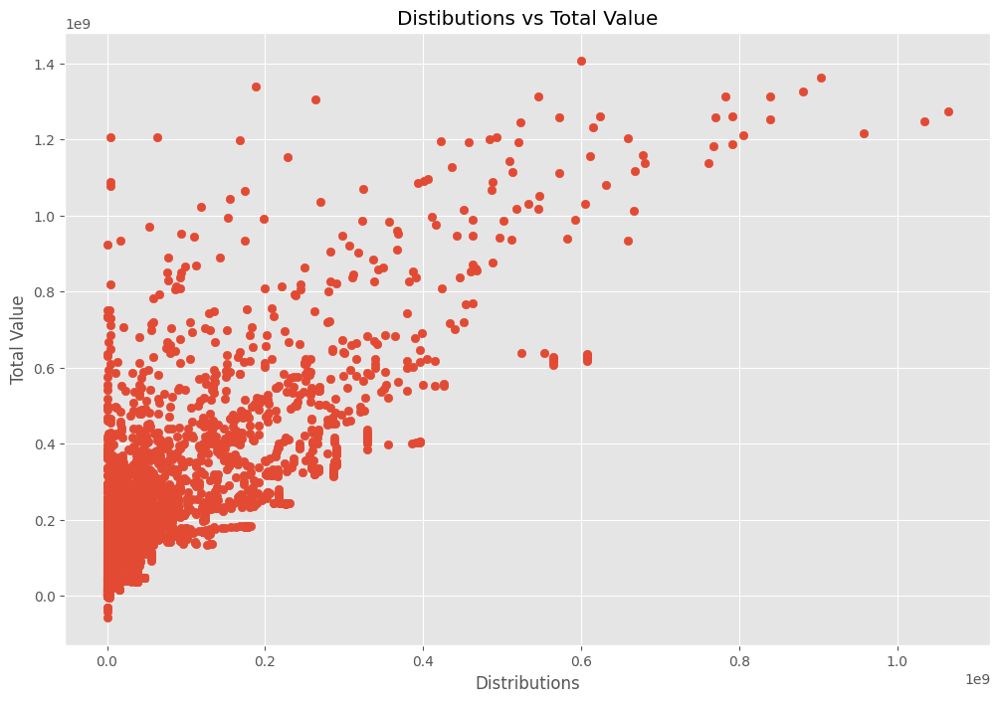

In [31]:
# Scatter plot with 'distributions' vs 'total_value'

plt.scatter(x=df['distributions'], y=df['total_value'])

plt.title('Distibutions vs Total Value')

plt.xlabel('Distributions')
plt.ylabel('Total Value')

plt.show()

In [83]:
df.head()

,report_date,assigned_unid,fund_name,initial_investment_date,commitment,contributions,unfunded_commitment,current_market_value,distributions,total_value,tvpi,net_benefit,irr,strategy
726,6/30/2021,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382186172,17789721,210336865,1064462072,1274798937,3.3,892612765,0.2505,Corporate Finance/Buyout - Mega
727,3/31/2021,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382137053,17835970,214303081,1034451864,1248754945,3.3,866617892,0.2489,Corporate Finance/Buyout - Mega
728,12/31/2020,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382034035,17938988,259564088,958061804,1217625892,3.2,835591857,0.2466,Corporate Finance/Buyout - Mega
2083,6/30/2021,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763227511,0,459696921,903905241,1363602162,1.8,600374651,0.1373,Growth Equity
2084,3/31/2021,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763227511,0,446606573,881030241,1327636814,1.7,564409303,0.1341,Growth Equity


<Axes: xlabel='distributions', ylabel='total_value'>

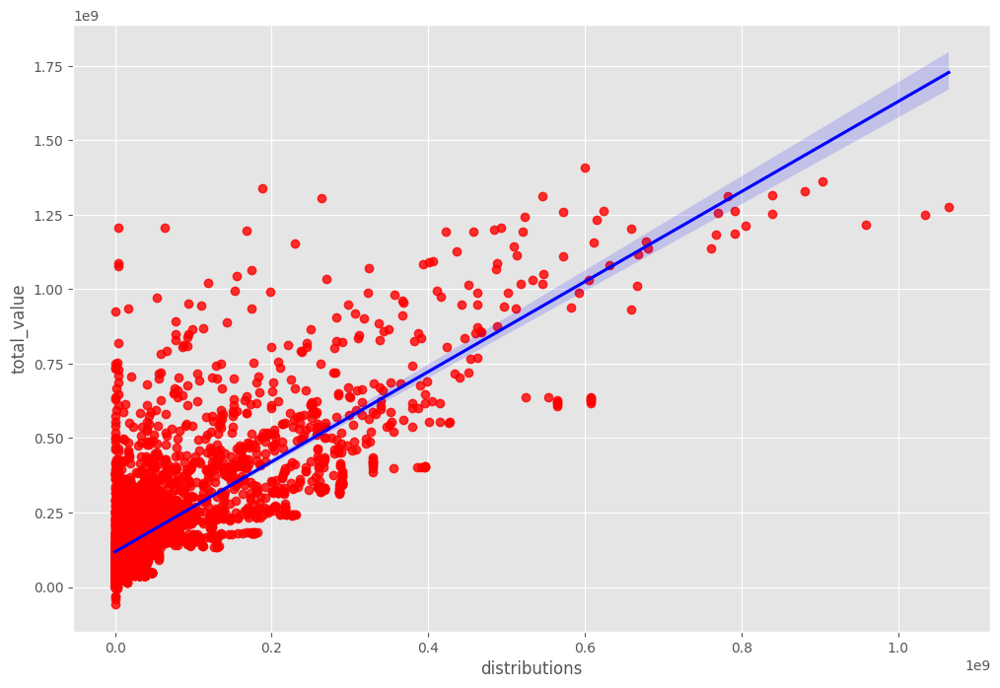

In [35]:
# Plot the 'distributions' vs 'total_value'

sns.regplot(x='distributions', y='total_value', data=df, scatter_kws={"color": "red"}, line_kws={"color": "blue"}) 

In [ ]:
# appears to be a positive correlation but needs further examination

In [37]:
# Looking at the correlation. Contains only numeric features (columns)

df.corr(method='pearson')

<ipython-input-37-8c0290315bee>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr(method='pearson')


,commitment,contributions,unfunded_commitment,current_market_value,distributions,total_value,tvpi,net_benefit,irr
commitment,1.000000,0.650954,0.626937,0.622624,0.229146,0.542538,-0.028821,0.314889,0.052849
contributions,0.650954,1.000000,-0.168653,0.891206,0.626980,0.930600,0.308207,0.677591,0.245484
unfunded_commitment,0.626937,-0.168653,1.000000,-0.115533,-0.306768,-0.236840,-0.355341,-0.273749,-0.187610
current_market_value,0.622624,0.891206,-0.115533,1.000000,0.384732,0.880511,0.405425,0.706727,0.324605
distributions,0.229146,0.626980,-0.306768,0.384732,1.000000,0.776153,0.488973,0.812163,0.186048
total_value,0.542538,0.930600,-0.236840,0.880511,0.776153,1.000000,0.528301,0.899608,0.317941
tvpi,-0.028821,0.308207,-0.355341,0.405425,0.488973,0.528301,1.000000,0.693345,0.599484
net_benefit,0.314889,0.677591,-0.273749,0.706727,0.812163,0.899608,0.693345,1.000000,0.344542
irr,0.052849,0.245484,-0.187610,0.324605,0.186048,0.317941,0.599484,0.344542,1.000000


In [ ]:
# 'distributions' has a high correlation with 'total_value' at 0.78

# Other high correlation values:
# 'total_value' and 'contributions' at 0.93
# 'total value' and 'net_benefit' at 0.90
# 'distributions' and 'net_benefit' at 0.81

<ipython-input-42-3278e6507fb6>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr(method='pearson')


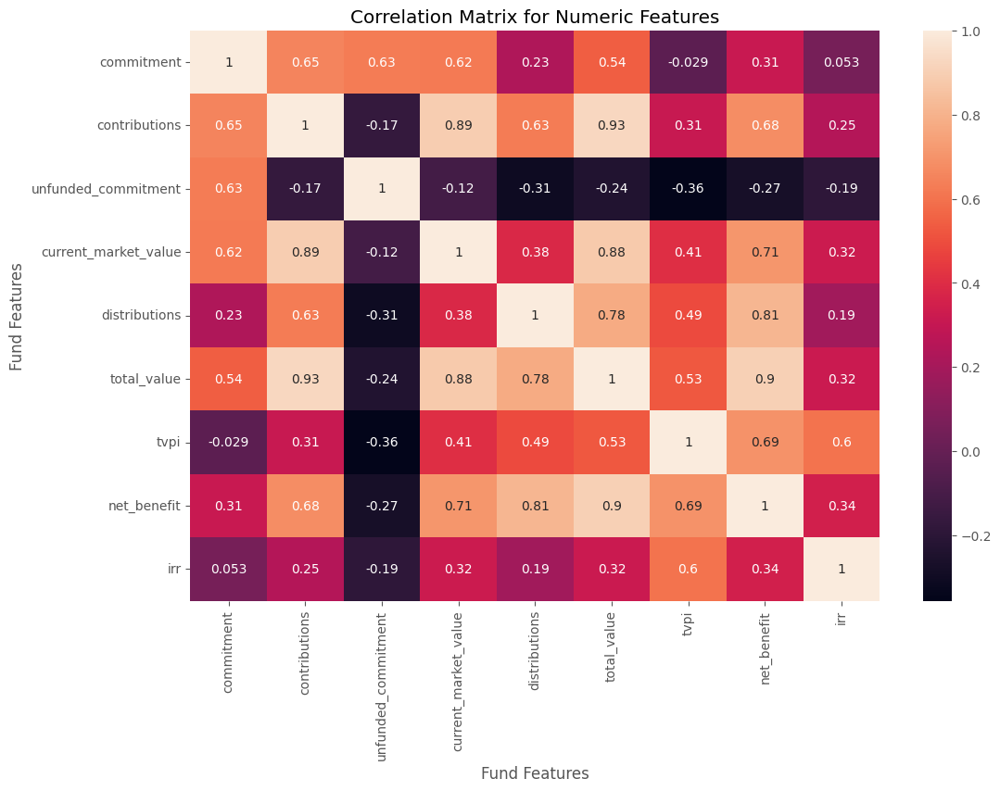

In [42]:
correlation_matrix = df.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')

plt.xlabel('Fund Features')
plt.ylabel('Fund Features')

plt.show()

In [43]:
# Looking at fund (which is not numeric) and converting it to a numeric representation (identifier)

df.head()

,report_date,assigned_unid,fund_name,initial_investment_date,commitment,contributions,unfunded_commitment,current_market_value,distributions,total_value,tvpi,net_benefit,irr,strategy,initial_investment_date_year
726,6/30/2021,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382186172,17789721,210336865,1064462072,1274798937,3.3,892612765,0.2505,Corporate Finance/Buyout - Mega,2011
727,3/31/2021,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382137053,17835970,214303081,1034451864,1248754945,3.3,866617892,0.2489,Corporate Finance/Buyout - Mega,2011
728,12/31/2020,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382034035,17938988,259564088,958061804,1217625892,3.2,835591857,0.2466,Corporate Finance/Buyout - Mega,2011
2083,6/30/2021,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763227511,0,459696921,903905241,1363602162,1.8,600374651,0.1373,Growth Equity,2012
2084,3/31/2021,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763227511,0,446606573,881030241,1327636814,1.7,564409303,0.1341,Growth Equity,2012


In [71]:
# Converting all the fields at one time and not only fund_name

df_numerized = df 

for col_name in df_numerized.columns:
  if(df_numerized[col_name].dtype=='object'):
    df_numerized[col_name] = df_numerized[col_name].astype('category')
    df_numerized[col_name] = df_numerized[col_name].cat.codes

df_numerized.head()

,report_date,assigned_unid,fund_name,initial_investment_date,commitment,contributions,unfunded_commitment,current_market_value,distributions,total_value,tvpi,net_benefit,irr,strategy,initial_investment_date_year
726,37,33,71,137,400000000,382186172,17789721,210336865,1064462072,1274798937,3.3,892612765,0.2505,2,2
727,24,33,71,137,400000000,382137053,17835970,214303081,1034451864,1248754945,3.3,866617892,0.2489,2,2
728,11,33,71,137,400000000,382034035,17938988,259564088,958061804,1217625892,3.2,835591857,0.2466,2,2
2083,37,107,179,104,750000000,763227511,0,459696921,903905241,1363602162,1.8,600374651,0.1373,6,3
2084,24,107,179,104,750000000,763227511,0,446606573,881030241,1327636814,1.7,564409303,0.1341,6,3


In [70]:
# Needed to the formula again and stored it a variable because Google Colab only runs in order
# Purpose: to order compare the numeric data frame above with the dataframe below

df = df.sort_values(by=['distributions'], inplace=False, ascending=False)

df.head()

,report_date,assigned_unid,fund_name,initial_investment_date,commitment,contributions,unfunded_commitment,current_market_value,distributions,total_value,tvpi,net_benefit,irr,strategy,initial_investment_date_year
726,6/30/2021,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382186172,17789721,210336865,1064462072,1274798937,3.3,892612765,0.2505,Corporate Finance/Buyout - Mega,2011
727,3/31/2021,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382137053,17835970,214303081,1034451864,1248754945,3.3,866617892,0.2489,Corporate Finance/Buyout - Mega,2011
728,12/31/2020,8LvT2uNVkxtpONTj8zYN,"Hellman & Friedman Capital Partners VII, L.P.",8/11/2011,400000000,382034035,17938988,259564088,958061804,1217625892,3.2,835591857,0.2466,Corporate Finance/Buyout - Mega,2011
2083,6/30/2021,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763227511,0,459696921,903905241,1363602162,1.8,600374651,0.1373,Growth Equity,2012
2084,3/31/2021,luUKyJ0jbhohp3t18gPh,"Warburg Pincus Private Equity XI, L.P.",5/24/2012,750000000,763227511,0,446606573,881030241,1327636814,1.7,564409303,0.1341,Growth Equity,2012


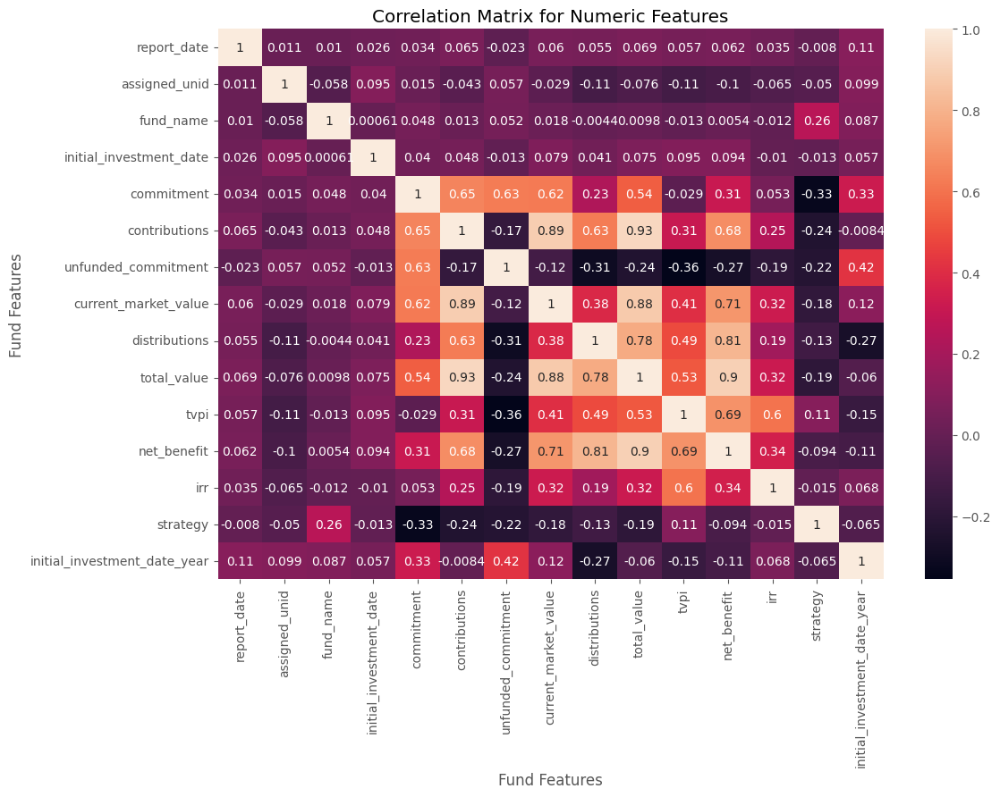

In [64]:
# The numerized matrix

correlation_matrix = df_numerized.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')

plt.xlabel('Fund Features')
plt.ylabel('Fund Features')

plt.show()

In [ ]:
# Interesting observations:
# a moderate positive linear relationship between the  between the "unfunded_commitment" and "initial_investment_date_year" columns.
# The positive correlation suggests that there may be a tendency for higher unfunded commitments to occur in more recent years or vice versa. 

In [65]:
df_numerized.corr()

,report_date,assigned_unid,fund_name,initial_investment_date,commitment,contributions,unfunded_commitment,current_market_value,distributions,total_value,tvpi,net_benefit,irr,strategy,initial_investment_date_year
report_date,1.000000,0.011348,0.010045,0.026195,0.033564,0.065198,-0.022876,0.059944,0.055012,0.068663,0.057485,0.061570,0.034734,-0.008025,0.105628
assigned_unid,0.011348,1.000000,-0.058051,0.095350,0.014897,-0.042885,0.057155,-0.029033,-0.108250,-0.075866,-0.112327,-0.100486,-0.064774,-0.050428,0.098895
fund_name,0.010045,-0.058051,1.000000,0.000609,0.047951,0.012697,0.051947,0.018313,-0.004443,0.009760,-0.013219,0.005409,-0.011553,0.263657,0.086910
initial_investment_date,0.026195,0.095350,0.000609,1.000000,0.039516,0.048385,-0.012914,0.079215,0.041080,0.075309,0.094657,0.093541,-0.010463,-0.013146,0.057315
commitment,0.033564,0.014897,0.047951,0.039516,1.000000,0.650954,0.626937,0.622624,0.229146,0.542538,-0.028821,0.314889,0.052849,-0.331814,0.326059
contributions,0.065198,-0.042885,0.012697,0.048385,0.650954,1.000000,-0.168653,0.891206,0.626980,0.930600,0.308207,0.677591,0.245484,-0.236291,-0.008374
unfunded_commitment,-0.022876,0.057155,0.051947,-0.012914,0.626937,-0.168653,1.000000,-0.115533,-0.306768,-0.236840,-0.355341,-0.273749,-0.187610,-0.218714,0.420649
current_market_value,0.059944,-0.029033,0.018313,0.079215,0.622624,0.891206,-0.115533,1.000000,0.384732,0.880511,0.405425,0.706727,0.324605,-0.179169,0.115860
distributions,0.055012,-0.108250,-0.004443,0.041080,0.229146,0.626980,-0.306768,0.384732,1.000000,0.776153,0.488973,0.812163,0.186048,-0.125490,-0.269104
total_value,0.068663,-0.075866,0.009760,0.075309,0.542538,0.930600,-0.236840,0.880511,0.776153,1.000000,0.528301,0.899608,0.317941,-0.186272,-0.059858


In [66]:
# Similar to unpivoting that data

correlation_mat = df_numerized.corr()

corr_pairs = correlation_mat.unstack()

corr_pairs

report_date                   report_date                     1.000000
                              assigned_unid                   0.011348
                              fund_name                       0.010045
                              initial_investment_date         0.026195
                              commitment                      0.033564
                              contributions                   0.065198
                              unfunded_commitment            -0.022876
                              current_market_value            0.059944
                              distributions                   0.055012
                              total_value                     0.068663
                              tvpi                            0.057485
                              net_benefit                     0.061570
                              irr                             0.034734
                              strategy                       -0.008025
      

In [67]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

tvpi                          unfunded_commitment            -0.355341
unfunded_commitment           tvpi                           -0.355341
commitment                    strategy                       -0.331814
strategy                      commitment                     -0.331814
unfunded_commitment           distributions                  -0.306768
distributions                 unfunded_commitment            -0.306768
net_benefit                   unfunded_commitment            -0.273749
unfunded_commitment           net_benefit                    -0.273749
initial_investment_date_year  distributions                  -0.269104
distributions                 initial_investment_date_year   -0.269104
total_value                   unfunded_commitment            -0.236840
unfunded_commitment           total_value                    -0.236840
contributions                 strategy                       -0.236291
strategy                      contributions                  -0.236291
unfund

In [69]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]

high_corr

total_value                   tvpi                            0.528301
tvpi                          total_value                     0.528301
commitment                    total_value                     0.542538
total_value                   commitment                      0.542538
irr                           tvpi                            0.599484
tvpi                          irr                             0.599484
commitment                    current_market_value            0.622624
current_market_value          commitment                      0.622624
unfunded_commitment           commitment                      0.626937
commitment                    unfunded_commitment             0.626937
distributions                 contributions                   0.626980
contributions                 distributions                   0.626980
commitment                    contributions                   0.650954
contributions                 commitment                      0.650954
      

In [ ]:
# Observations:
# 'fund_name' was not significant enough to determine whether there was a high correlation with the 'distributions'
# however there is a high correlation with 'distributions' and 'net_benefit' at 0.81